<a href="https://colab.research.google.com/github/alibarro/colab/blob/main/EnMAP_Mineral_Exploration_Workflow_DRC_ndvi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EnMAP Hyperspectral Mineral Exploration Workflow

This notebook processes **EnMAP** (Environmental Mapping and Analysis Program) L2A hyperspectral imagery for mineral exploration in Google Colab.

EnMAP has 224 spectral bands: VNIR (~420–1000 nm) and SWIR (~900–2450 nm), ~30 m resolution — well suited to mapping iron oxides, clays, micas, carbonates, and other hydroxyl/sulfate-bearing alteration minerals.

**Pipeline:**
1. Setup & data access (Google Drive / direct upload / DLR portal)
2. Load EnMAP L2A cube + wavelengths from metadata
3. Preprocessing (bad-band removal, water-vapor band masking, scaling, cloud/shadow/haze/cirrus masking, vegetation masking via NDVI)
4. True/false color visualization
5. Mineral band-ratio indices
6. Continuum removal & absorption-feature analysis
7. Spectral Angle Mapper (SAM) vs. USGS spectral library endmembers
8. PCA / MNF dimensionality reduction
9. Unsupervised mineral zonation (K-Means)
10. Export results as GeoTIFF
11. Add L-band SAR radar imagery (ALOS PALSAR-2 / NISAR) — structural/lineament mapping
12. Fuse SAR structure with EnMAP mineral indices into a combined prospectivity map

> Replace file paths in the **Data Access** cell with your own EnMAP scene. EnMAP L2A data is free — request/download from the [EOWEB GeoPortal](https://eoweb.dlr.de) or DLR's EnMAP portal.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Setup — install & import packages

In [2]:
!pip -q install rasterio spectral scikit-learn matplotlib numpy scipy requests

import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import reshape_as_image
import xml.etree.ElementTree as ET
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.interpolate import interp1d

np.seterr(all='ignore')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.2/215.2 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

## 2. Data access

Three common options — use whichever applies:

- **Google Drive**: mount your Drive and point `SPECTRAL_PATH` to the EnMAP GeoTIFF/BSQ cube there.
- **Direct upload**: use the Colab file-upload widget for smaller clipped scenes.
- **DLR portal**: download an L2A product (`ENMAP01-____L2A-...SPECTRAL_IMAGE.TIF` + `...METADATA.XML`) locally first, then upload/mount it.

In [3]:
# --- Option A: Google Drive ---
# from google.colab import drive
# drive.mount('/content/drive')

# --- Option B: direct upload (uncomment to use) ---
# from google.colab import files
# uploaded = files.upload()

# EDIT THESE to match your scene:
SPECTRAL_PATH = '/content/drive/MyDrive/Enmap/ENMAP01_DRC_SPECTRAL.TIF'
METADATA_PATH = '/content/drive/MyDrive/Enmap/ENMAP01_DRC_METADATA.XML'

print('Spectral image exists:', os.path.exists(SPECTRAL_PATH))
print('Metadata exists:', os.path.exists(METADATA_PATH))

Spectral image exists: True
Metadata exists: True


## 3. Load cube and band wavelengths

In [7]:
def load_enmap_cube(SPECTRAL_PATH):
    """Load an EnMAP L2A GeoTIFF cube. Returns (cube [bands,rows,cols], profile)."""
    with rasterio.open(SPECTRAL_PATH) as src:
        cube = src.read().astype(np.float32)
        profile = src.profile
    return cube, profile

def load_enmap_wavelengths(METADATA_PATH):
    """Parse band center wavelengths (nm) and quality flags from EnMAP metadata XML.
    Falls back to the nominal EnMAP band grid if parsing fails."""
    try:
        tree = ET.parse(METADATA_PATH)
        root = tree.getroot()
        wavelengths = []
        for band in root.iter('bandCharacterisation'):
            for wl in band.iter('wavelengthCenterOfBand'):
                wavelengths.append(float(wl.text))
        if wavelengths:
            return np.array(wavelengths)
    except Exception as e:
        print('Metadata parse failed, using nominal grid:', e)
    # Nominal EnMAP grid fallback: ~91 VNIR (420-1000nm) + ~133 SWIR (900-2450nm)
    vnir = np.linspace(420, 1000, 91)
    swir = np.linspace(902, 2450, 133)
    return np.concatenate([vnir, swir])

if os.path.exists(SPECTRAL_PATH):
    try:
        cube, profile = load_enmap_cube(SPECTRAL_PATH)
        wavelengths = load_enmap_wavelengths(METADATA_PATH) if os.path.exists(METADATA_PATH) else load_enmap_wavelengths('')
        print('Cube shape (bands, rows, cols):', cube.shape)
        print('Number of wavelengths parsed:', len(wavelengths))
    except rasterio.errors.RasterioIOError as e:
        print(f"Error loading SPECTRAL_PATH with rasterio: {e}")
        print('Falling back to synthetic demo cube.')
        rows, cols, bands = 150, 150, 224
        vnir = np.linspace(420, 1000, 91)
        swir = np.linspace(902, 2450, 133)
        wavelengths = np.concatenate([vnir, swir])
        rng = np.random.default_rng(0)
        base = 0.2 + 0.05*np.sin(wavelengths/200)
        cube = np.tile(base[:, None, None], (1, rows, cols)) + rng.normal(0, 0.01, (bands, rows, cols))
        cube = cube.astype(np.float32)
        profile = {'driver': 'GTiff', 'height': rows, 'width': cols, 'count': bands,
                   'dtype': 'float32', 'crs': None, 'transform': rasterio.Affine.identity()}
else:
    print('No file found at SPECTRAL_PATH — using a synthetic demo cube so the rest of the notebook still runs.')
    rows, cols, bands = 150, 150, 224
    vnir = np.linspace(420, 1000, 91)
    swir = np.linspace(902, 2450, 133)
    wavelengths = np.concatenate([vnir, swir])
    rng = np.random.default_rng(0)
    base = 0.2 + 0.05*np.sin(wavelengths/200)
    cube = np.tile(base[:, None, None], (1, rows, cols)) + rng.normal(0, 0.01, (bands, rows, cols))
    cube = cube.astype(np.float32)
    profile = {'driver': 'GTiff', 'height': rows, 'width': cols, 'count': bands,
               'dtype': 'float32', 'crs': None, 'transform': rasterio.Affine.identity()}

Cube shape (bands, rows, cols): (224, 1157, 1222)
Number of wavelengths parsed: 224


## Visualize first 10 bands

## 4. Preprocessing — scaling, bad-band & water-vapor masking

In [8]:
def preprocess_cube(cube, wavelengths, scale_factor=10000.0,
                     water_vapor_windows=((1350,1470),(1780,2000)), nodata=-32768):
    """Scale DN to reflectance, mask nodata, and flag noisy water-vapor absorption bands.
    Returns reflectance cube and a boolean 'good_bands' mask."""
    refl = cube.copy()
    refl[refl == nodata] = np.nan
    if refl.max() > 1.5:  # looks like scaled integer reflectance
        refl = refl / scale_factor

    good_bands = np.ones(len(wavelengths), dtype=bool)
    for lo, hi in water_vapor_windows:
        good_bands &= ~((wavelengths >= lo) & (wavelengths <= hi))
    # drop bands with excessive NaNs (dead detector elements)
    nan_frac = np.isnan(refl).reshape(refl.shape[0], -1).mean(axis=1)
    good_bands &= (nan_frac < 0.3)
    return refl, good_bands

refl, good_bands = preprocess_cube(cube, wavelengths)
print(f'Kept {good_bands.sum()} / {len(wavelengths)} bands after masking noisy/water-vapor regions.')

refl_clean = refl[good_bands]
wl_clean = wavelengths[good_bands]

Kept 212 / 224 bands after masking noisy/water-vapor regions.


## 4.1 Cloud, cloud-shadow, haze & cirrus masking

This runs **first**, before vegetation masking and before any mineral processing, because cloud/shadow/haze contamination can imitate real alteration signals: thin cloud and haze inflate reflectance and can mimic bright high-albedo minerals, while cloud shadow depresses it and can mimic dark ferrous/mafic signatures. Masking it out after vegetation but before the mineral indices would let it bias the NDVI vegetation statistics; masking it before everything avoids that.

**The right way to do this** is with EnMAP's own L2A quality/classification layers, not a post-hoc spectral guess -- DLR's L2A processor derives them from the actual atmospheric and viewing conditions at acquisition time, which a spectral proxy computed after the fact cannot fully reconstruct. EnMAP L2A deliveries ship one or more quality GeoTIFFs alongside the spectral cube (naming varies by processing baseline -- check your product's README/metadata for the exact files you received):

- `..._QUALITY_CLASSES.TIF` -- a single combined classification (preferred if present)
- `..._QUALITY_CLOUD.TIF`, `..._QUALITY_CLOUDSHADOW.TIF`, `..._QUALITY_HAZE.TIF`, `..._QUALITY_CIRRUS.TIF` -- per-flag binary masks, used if no combined classes layer is supplied

If neither is available, a coarse spectral fallback is used instead and clearly flagged as a stopgap -- it will catch obvious thick cloud but is not a substitute for the real product, and won't reliably catch thin cirrus or shadow.

In [10]:
# EDIT THESE to match the quality layer(s) shipped with your EnMAP L2A product.
QUALITY_CLASSES_PATH     = '/content/drive/MyDrive/Enmap/ENMAP01_DRC_QUALITY_CLASSES.TIF'
QUALITY_CLOUD_PATH       = '/content/drive/MyDrive/Enmap/ENMAP01_DRC_QUALITY_CLOUD.TIF'
QUALITY_CLOUDSHADOW_PATH = '/content/drive/MyDrive/Enmap/ENMAP01_DRC_QUALITY_CLOUDSHADOW.TIF'
QUALITY_HAZE_PATH        = '/content/drive/MyDrive/Enmap/ENMAP01_DRC_QUALITY_HAZE.TIF'
QUALITY_CIRRUS_PATH      = '/content/drive/MyDrive/Enmap/ENMAP01_DRC_QUALITY_CIRRUS.TIF'

for name, p in [('classes', QUALITY_CLASSES_PATH), ('cloud', QUALITY_CLOUD_PATH),
                ('cloud shadow', QUALITY_CLOUDSHADOW_PATH), ('haze', QUALITY_HAZE_PATH),
                ('cirrus', QUALITY_CIRRUS_PATH)]:
    print(f'Quality layer ({name}) exists:', os.path.exists(p))

Quality layer (classes) exists: True
Quality layer (cloud) exists: True
Quality layer (cloud shadow) exists: True
Quality layer (haze) exists: True
Quality layer (cirrus) exists: True


Cloud/shadow/haze/cirrus mask built from EnMAP L2A quality layers (QUALITY_CLASSES layer).
0.0% of pixels flagged as cloud/shadow/haze/cirrus and excluded from all downstream processing.


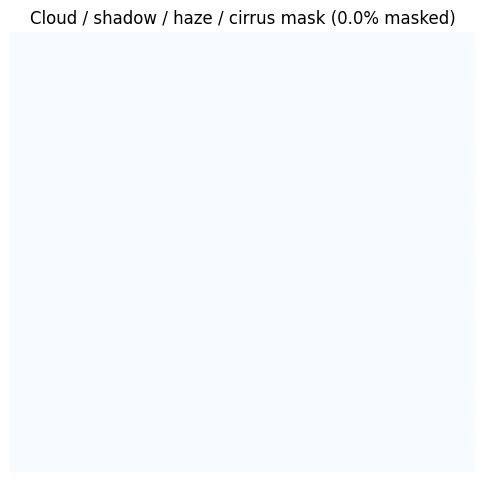

In [11]:
# Class codes for a combined QUALITY_CLASSES layer -- confirm these against your product's own
# metadata/README, since DLR has used slightly different coding across processing baselines.
UNUSABLE_CLASS_VALUES = {1, 2, 3, 4}  # e.g. 1=cloud, 2=cloud shadow, 3=haze, 4=cirrus

# Helper function to load a single band from a GeoTIFF and its profile
def load_mask_band_with_profile(path):
    with rasterio.open(path) as src:
        arr = src.read(1)
        profile = src.profile
    return arr, profile

# Helper function for resampling, adapted from later in the notebook for masks
from rasterio.warp import reproject, Resampling

def resample_mask_to_reference(src_array, src_profile, ref_profile):
    """Reproject/resample a single-band mask array onto the reference (EnMAP) grid."""
    # Create a destination array with the shape of the reference and fill with an invalid value
    # Change dtype to np.int16 to allow for fill_value = -1
    dst_shape = (ref_profile['height'], ref_profile['width'])
    dst = np.full(dst_shape, -1, dtype=np.int16) # Use -1 as a placeholder for non-boolean masks

    reproject(
        source=src_array,
        destination=dst,
        src_transform=src_profile['transform'],
        src_crs=src_profile['crs'],
        dst_transform=ref_profile['transform'],
        dst_crs=ref_profile['crs'],
        resampling=Resampling.nearest, # Use nearest for categorical masks
    )
    return dst

spatial_shape = refl_clean.shape[1:]
cloud_mask = np.zeros(spatial_shape, dtype=bool)
quality_source = None

if os.path.exists(QUALITY_CLASSES_PATH):
    classes_raw, classes_profile = load_mask_band_with_profile(QUALITY_CLASSES_PATH)
    # Resample classes_raw to match the spatial_shape of refl_clean
    # The 'profile' variable holds the profile of the main EnMAP data cube.
    classes_resampled = resample_mask_to_reference(classes_raw, classes_profile, profile)
    cloud_mask |= np.isin(classes_resampled, list(UNUSABLE_CLASS_VALUES))
    quality_source = 'QUALITY_CLASSES layer'
else:
    found_any = False
    for label, p in [('cloud', QUALITY_CLOUD_PATH), ('cloud shadow', QUALITY_CLOUDSHADOW_PATH),
                      ('haze', QUALITY_HAZE_PATH), ('cirrus', QUALITY_CIRRUS_PATH)]:
        if os.path.exists(p):
            mask_raw, mask_profile = load_mask_band_with_profile(p)
            resampled_mask = resample_mask_to_reference(mask_raw, mask_profile, profile)
            cloud_mask |= (resampled_mask > 0)
            found_any = True
    if found_any:
        quality_source = 'per-flag QUALITY_* layers'

if quality_source:
    print(f'Cloud/shadow/haze/cirrus mask built from EnMAP L2A quality layers ({quality_source}).')
else:
    print('No EnMAP quality layer found -- falling back to a coarse spectral cloud/haze proxy.')
    print('This is a stopgap only; prefer the official L2A quality layers whenever available.')

    def spectral_cloud_fallback(refl, wl, vis_range=(450, 700), swir_range=(2000, 2300),
                                  brightness_thresh=0.30, flatness_thresh=0.06):
        """Clouds/thick haze are simultaneously bright across the visible and spectrally flat --
        natural rock, soil, and vegetation almost always show some absorption structure. Neither
        test alone is reliable; combined, they catch the obvious thick-cloud case (not thin
        cirrus or shadow -- use the real quality layer for those)."""
        vis_bands = (wl >= vis_range[0]) & (wl <= vis_range[1])
        swir_bands = (wl >= swir_range[0]) & (wl <= swir_range[1])
        brightness = np.nanmean(refl[vis_bands], axis=0)
        swir_mean = np.nanmean(refl[swir_bands], axis=0)
        swir_std = np.nanstd(refl[swir_bands], axis=0)
        flatness = swir_std / (swir_mean + 1e-6)
        return (brightness > brightness_thresh) & (flatness < flatness_thresh)

    cloud_mask = spectral_cloud_fallback(refl_clean, wl_clean)

pct_cloud = 100 * cloud_mask.mean()
print(f'{pct_cloud:.1f}% of pixels flagged as cloud/shadow/haze/cirrus and excluded from all downstream processing.')

plt.figure(figsize=(6, 6))
plt.imshow(cloud_mask, cmap='Blues')
plt.title(f'Cloud / shadow / haze / cirrus mask ({pct_cloud:.1f}% masked)')
plt.axis('off')
plt.show()

# Null out flagged pixels across every band, before vegetation masking or any mineral
# processing runs. Everything downstream already treats NaN as invalid.
refl_clean[:, cloud_mask] = np.nan

## 4.2 Mask vegetation before any mineral processing

With cloud/shadow/haze already excluded above, the next contaminant to remove is vegetation: much of the DRC study area sits under dense rainforest canopy, and vegetation's strong red absorption / NIR reflectance can dominate or distort the reflectance signal that the band-ratio indices, continuum removal, SAM, PCA, and K-Means steps below all rely on. NDVI is computed here from the cleaned cube and thresholded to flag canopy-covered pixels, which are then set to NaN across **every** band. Every downstream step in this notebook already treats NaN as invalid (percentile stretches, SAM's `valid` mask, PCA/K-Means's `valid_mask`), so this one masking step is enough to keep vegetated pixels out of all the mineral results that follow -- they'll show up as blank/excluded regions rather than false alteration signals.

This is also part of why the L-band SAR added in Section 12 is worth pairing with EnMAP here: SAR can see structure *through* the canopy that this optical mask has to exclude entirely.

Vegetation mask: 0.0% of pixels flagged as vegetated (NDVI > 0.35) and excluded below.


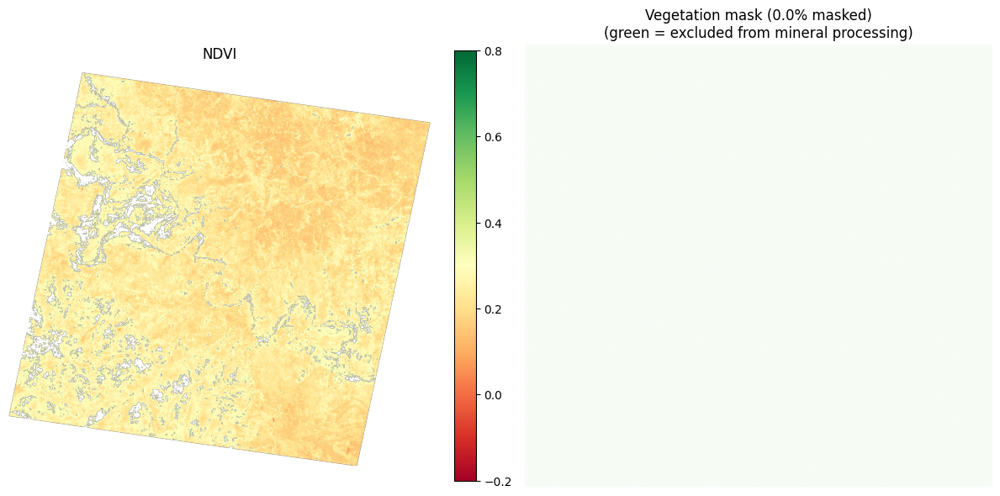

In [12]:
NDVI_THRESHOLD = 0.35  # typical: NDVI > 0.3-0.4 ~ vegetated canopy. Lower for degraded/sparse
                       # cover, raise for dense closed-canopy rainforest.

# Inline nearest-band lookup (not the nearest_band() helper from Section 5,
# which isn't defined yet at this point in the notebook)
red_idx = int(np.argmin(np.abs(wl_clean - 650)))
nir_idx = int(np.argmin(np.abs(wl_clean - 850)))
red = refl_clean[red_idx]
nir = refl_clean[nir_idx]

with np.errstate(divide='ignore', invalid='ignore'):
    ndvi = (nir - red) / (nir + red)

vegetation_mask = ndvi > NDVI_THRESHOLD  # True = vegetated -> excluded from mineral processing
pct_vegetated = np.nanmean(vegetation_mask) * 100
print(f'Vegetation mask: {pct_vegetated:.1f}% of pixels flagged as vegetated (NDVI > {NDVI_THRESHOLD}) and excluded below.')

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
im0 = axes[0].imshow(ndvi, cmap='RdYlGn', vmin=-0.2, vmax=0.8)
axes[0].set_title('NDVI'); axes[0].axis('off')
plt.colorbar(im0, ax=axes[0], fraction=0.046)

axes[1].imshow(vegetation_mask, cmap='Greens')
axes[1].set_title(f'Vegetation mask ({pct_vegetated:.1f}% masked)\n(green = excluded from mineral processing)')
axes[1].axis('off')
plt.tight_layout(); plt.show()

# Null out vegetated pixels across every band before any mineral processing runs.
refl_clean[:, vegetation_mask] = np.nan

## 5. Visualization — true color & false color composites

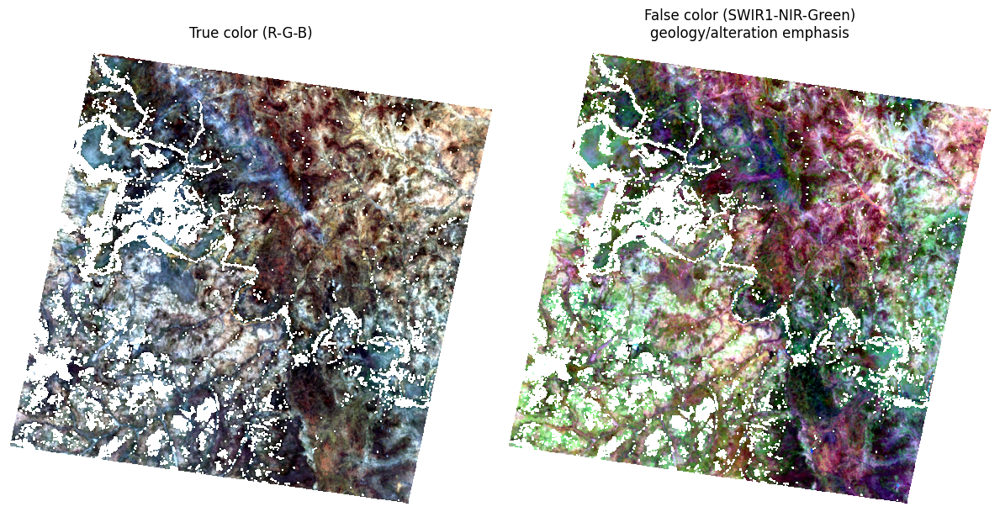

In [15]:
def nearest_band(wl_array, target_nm):
    return int(np.argmin(np.abs(wl_array - target_nm)))

def stretch(img, p_low=2, p_high=98):
    lo, hi = np.nanpercentile(img, [p_low, p_high])
    out = np.clip((img - lo) / (hi - lo + 1e-9), 0, 1)
    return out

r = nearest_band(wl_clean, 650)   # red
g = nearest_band(wl_clean, 550)   # green
b = nearest_band(wl_clean, 460)   # blue
swir1 = nearest_band(wl_clean, 1650)
swir2 = nearest_band(wl_clean, 2200)
nir = nearest_band(wl_clean, 850)

true_color = np.dstack([stretch(refl_clean[r]), stretch(refl_clean[g]), stretch(refl_clean[b])])
false_color = np.dstack([stretch(refl_clean[swir1]), stretch(refl_clean[nir]), stretch(refl_clean[g])])

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(true_color); axes[0].set_title('True color (R-G-B)'); axes[0].axis('off')
axes[1].imshow(false_color); axes[1].set_title('False color (SWIR1-NIR-Green)\ngeology/alteration emphasis'); axes[1].axis('off')
plt.tight_layout(); plt.show()

## 6. Mineral band-ratio indices

Standard ASTER/hyperspectral-style ratios adapted to EnMAP's continuous bands:

| Index | Ratio | Targets |
|---|---|---|
| Iron oxide | 650 / 450 nm | hematite, goethite, gossan |
| Ferrous iron | 950 / 550 nm | Fe²⁺ in silicates |
| Al-OH (clay/mica) | 2160 / 2190 nm depth | kaolinite, sericite, muscovite |
| Mg-OH / carbonate | 2330 / 2120 nm | chlorite, carbonate, epidote |
| Hydroxyl generic | 2200 / 2100 nm | phyllosilicates |

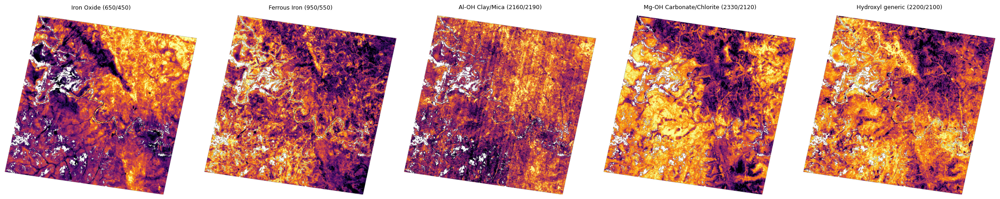

In [16]:
def band(nm):
    return refl_clean[nearest_band(wl_clean, nm)]

with np.errstate(divide='ignore', invalid='ignore'):
    iron_oxide   = band(650)  / band(450)
    ferrous_iron = band(950)  / band(550)
    al_oh        = band(2160) / band(2190)
    mg_oh_carb   = band(2330) / band(2120)
    hydroxyl     = band(2200) / band(2100)

indices = {
    'Iron Oxide (650/450)': iron_oxide,
    'Ferrous Iron (950/550)': ferrous_iron,
    'Al-OH Clay/Mica (2160/2190)': al_oh,
    'Mg-OH Carbonate/Chlorite (2330/2120)': mg_oh_carb,
    'Hydroxyl generic (2200/2100)': hydroxyl,
}

fig, axes = plt.subplots(1, 5, figsize=(22, 5))
for ax, (name, img) in zip(axes, indices.items()):
    im = ax.imshow(stretch(img), cmap='inferno')
    ax.set_title(name, fontsize=9); ax.axis('off')
plt.tight_layout(); plt.show()

Here's the code with a per-index percentile stretch (more robust than a single generic stretch(), since each ratio index can have very different dynamic ranges/outliers):

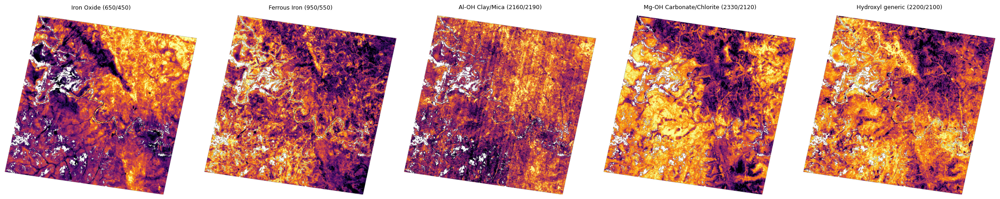

In [17]:
def band(nm):
    return refl_clean[nearest_band(wl_clean, nm)]

with np.errstate(divide='ignore', invalid='ignore'):
    iron_oxide   = band(650)  / band(450)
    ferrous_iron = band(950)  / band(550)
    al_oh        = band(2160) / band(2190)
    mg_oh_carb   = band(2330) / band(2120)
    hydroxyl     = band(2200) / band(2100)

indices = {
    'Iron Oxide (650/450)': iron_oxide,
    'Ferrous Iron (950/550)': ferrous_iron,
    'Al-OH Clay/Mica (2160/2190)': al_oh,
    'Mg-OH Carbonate/Chlorite (2330/2120)': mg_oh_carb,
    'Hydroxyl generic (2200/2100)': hydroxyl,
}

def contrast_stretch(img, low=2, high=98):
    """Per-image percentile clip + rescale to [0,1], ignoring NaN/Inf."""
    valid = np.isfinite(img)
    if not valid.any():
        return np.zeros_like(img)
    vmin, vmax = np.nanpercentile(img[valid], [low, high])
    if vmax <= vmin:
        vmax = vmin + 1e-6
    out = np.clip((img - vmin) / (vmax - vmin), 0, 1)
    out[~valid] = np.nan  # keep invalid pixels transparent/masked
    return out

fig, axes = plt.subplots(1, 5, figsize=(22, 5))
for ax, (name, img) in zip(axes, indices.items()):
    stretched = contrast_stretch(img, low=2, high=98)
    im = ax.imshow(stretched, cmap='inferno', vmin=0, vmax=1)
    ax.set_title(name, fontsize=9); ax.axis('off')
plt.tight_layout(); plt.show()

Here's the code with a colorbar added to each subplot:

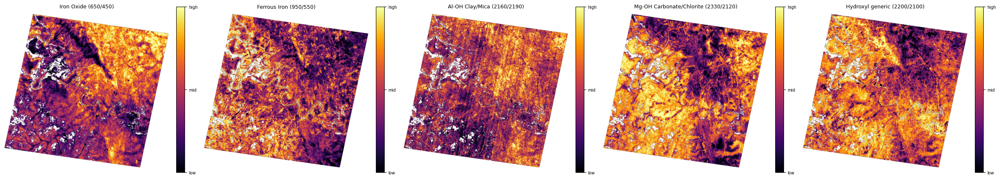

In [18]:
def band(nm):
    return refl_clean[nearest_band(wl_clean, nm)]

with np.errstate(divide='ignore', invalid='ignore'):
    iron_oxide   = band(650)  / band(450)
    ferrous_iron = band(950)  / band(550)
    al_oh        = band(2160) / band(2190)
    mg_oh_carb   = band(2330) / band(2120)
    hydroxyl     = band(2200) / band(2100)

indices = {
    'Iron Oxide (650/450)': iron_oxide,
    'Ferrous Iron (950/550)': ferrous_iron,
    'Al-OH Clay/Mica (2160/2190)': al_oh,
    'Mg-OH Carbonate/Chlorite (2330/2120)': mg_oh_carb,
    'Hydroxyl generic (2200/2100)': hydroxyl,
}

def contrast_stretch(img, low=2, high=98):
    """Per-image percentile clip + rescale to [0,1], ignoring NaN/Inf."""
    valid = np.isfinite(img)
    if not valid.any():
        return np.zeros_like(img)
    vmin, vmax = np.nanpercentile(img[valid], [low, high])
    if vmax <= vmin:
        vmax = vmin + 1e-6
    out = np.clip((img - vmin) / (vmax - vmin), 0, 1)
    out[~valid] = np.nan  # keep invalid pixels transparent/masked
    return out

fig, axes = plt.subplots(1, 5, figsize=(24, 5))
for ax, (name, img) in zip(axes, indices.items()):
    stretched = contrast_stretch(img, low=2, high=98)
    im = ax.imshow(stretched, cmap='inferno', vmin=0, vmax=1)
    ax.set_title(name, fontsize=9); ax.axis('off')

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels(['low', 'mid', 'high'])
    cbar.ax.tick_params(labelsize=7)

plt.tight_layout(); plt.show()

Here's the code with contour lines added to mark the medium-to-high range on each index map:

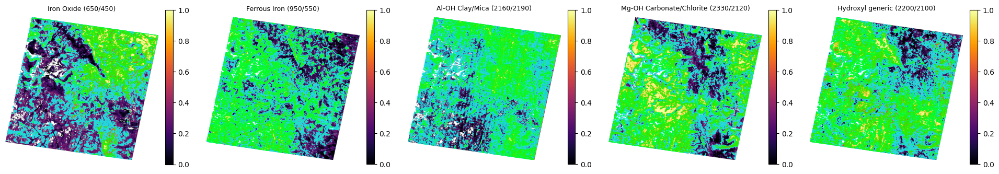

In [19]:
def band(nm):
    return refl_clean[nearest_band(wl_clean, nm)]

with np.errstate(divide='ignore', invalid='ignore'):
    iron_oxide   = band(650)  / band(450)
    ferrous_iron = band(950)  / band(550)
    al_oh        = band(2160) / band(2190)
    mg_oh_carb   = band(2330) / band(2120)
    hydroxyl     = band(2200) / band(2100)

indices = {
    'Iron Oxide (650/450)': iron_oxide,
    'Ferrous Iron (950/550)': ferrous_iron,
    'Al-OH Clay/Mica (2160/2190)': al_oh,
    'Mg-OH Carbonate/Chlorite (2330/2120)': mg_oh_carb,
    'Hydroxyl generic (2200/2100)': hydroxyl,
}

def contrast_stretch(img, low=2, high=98):
    """Per-image percentile clip + rescale to [0,1], ignoring NaN/Inf."""
    valid = np.isfinite(img)
    if not valid.any():
        return np.zeros_like(img)
    vmin, vmax = np.nanpercentile(img[valid], [low, high])
    if vmax <= vmin:
        vmax = vmin + 1e-6
    out = np.clip((img - vmin) / (vmax - vmin), 0, 1)
    out[~valid] = np.nan  # keep invalid pixels transparent/masked
    return out

# Contour levels marking medium (0.5) and high (0.75) thresholds on the stretched scale
contour_levels = [0.5, 0.75]
contour_colors = ['cyan', 'lime']

fig, axes = plt.subplots(1, 5, figsize=(24, 5))
for ax, (name, img) in zip(axes, indices.items()):
    stretched = contrast_stretch(img, low=2, high=98)
    im = ax.imshow(stretched, cmap='inferno', vmin=0, vmax=1)
    ax.set_title(name, fontsize=9); ax.axis('off')

    # Fill NaNs for contouring only (contour can't handle NaN gaps well)
    contour_data = np.nan_to_num(stretched, nan=-1)
    cs = ax.contour(contour_data, levels=contour_levels, colors=contour_colors,
                     linewidths=0.8, alpha=0.8)

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

Here's the code with the colorbar redrawn as a segmented bar that visually matches the contour colors on the map:

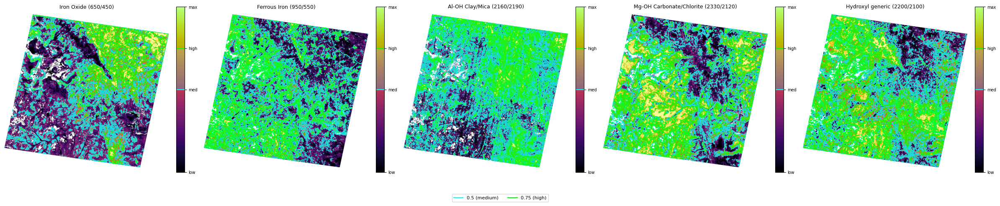

In [20]:
import matplotlib.colors as mcolors

def band(nm):
    return refl_clean[nearest_band(wl_clean, nm)]

with np.errstate(divide='ignore', invalid='ignore'):
    iron_oxide   = band(650)  / band(450)
    ferrous_iron = band(950)  / band(550)
    al_oh        = band(2160) / band(2190)
    mg_oh_carb   = band(2330) / band(2120)
    hydroxyl     = band(2200) / band(2100)

indices = {
    'Iron Oxide (650/450)': iron_oxide,
    'Ferrous Iron (950/550)': ferrous_iron,
    'Al-OH Clay/Mica (2160/2190)': al_oh,
    'Mg-OH Carbonate/Chlorite (2330/2120)': mg_oh_carb,
    'Hydroxyl generic (2200/2100)': hydroxyl,
}

def contrast_stretch(img, low=2, high=98):
    """Per-image percentile clip + rescale to [0,1], ignoring NaN/Inf."""
    valid = np.isfinite(img)
    if not valid.any():
        return np.zeros_like(img)
    vmin, vmax = np.nanpercentile(img[valid], [low, high])
    if vmax <= vmin:
        vmax = vmin + 1e-6
    out = np.clip((img - vmin) / (vmax - vmin), 0, 1)
    out[~valid] = np.nan  # keep invalid pixels transparent/masked
    return out

# Contour levels marking medium (0.5) and high (0.75) thresholds on the stretched scale
contour_levels = [0.5, 0.75]
contour_colors = ['cyan', 'lime']

fig, axes = plt.subplots(1, 5, figsize=(24, 5))
for ax, (name, img) in zip(axes, indices.items()):
    stretched = contrast_stretch(img, low=2, high=98)
    im = ax.imshow(stretched, cmap='inferno', vmin=0, vmax=1)
    ax.set_title(name, fontsize=9); ax.axis('off')

    # Fill NaNs for contouring only (contour can't handle NaN gaps well)
    contour_data = np.nan_to_num(stretched, nan=-1)
    cs = ax.contour(contour_data, levels=contour_levels, colors=contour_colors,
                     linewidths=0.8, alpha=0.8)

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_ticks([0, 0.5, 0.75, 1])
    cbar.set_ticklabels(['low', 'med', 'high', 'max'])
    cbar.ax.tick_params(labelsize=7)

    # --- Redrawn legend bar: overlay colored bands matching the contour thresholds ---
    # Draw translucent bands over the inferno gradient at [0.5-0.75] and [0.75-1.0]
    # so the colorbar visually segments the same way the contours divide the map.
    band_bounds = [0.0] + contour_levels + [1.0]
    band_fill_colors = ['none', 'none'] + [contour_colors[-1]]  # placeholder, refined below
    for i, (lo, hi) in enumerate(zip(band_bounds[:-1], band_bounds[1:])):
        if i == 0:
            continue  # leave the low band as plain inferno, no overlay
        color = contour_colors[i - 1]
        cbar.ax.axhspan(lo, hi, color=color, alpha=0.25, lw=0)
    # Crisp boundary lines exactly at the contour thresholds
    for level, color in zip(contour_levels, contour_colors):
        cbar.ax.axhline(level, color=color, linewidth=1.5)

fig.legend(handles=[plt.Line2D([0], [0], color=c, lw=1.5) for c in contour_colors],
           labels=['0.5 (medium)', '0.75 (high)'],
           loc='lower center', ncol=2, fontsize=8, bbox_to_anchor=(0.5, -0.05))

plt.tight_layout(); plt.show()

## 7. Continuum removal

Normalizes each pixel's spectrum to isolate absorption-feature depth/position — key for identifying specific diagnostic minerals (e.g., kaolinite doublet ~2160/2200 nm, alunite ~2170 nm, calcite ~2330 nm).

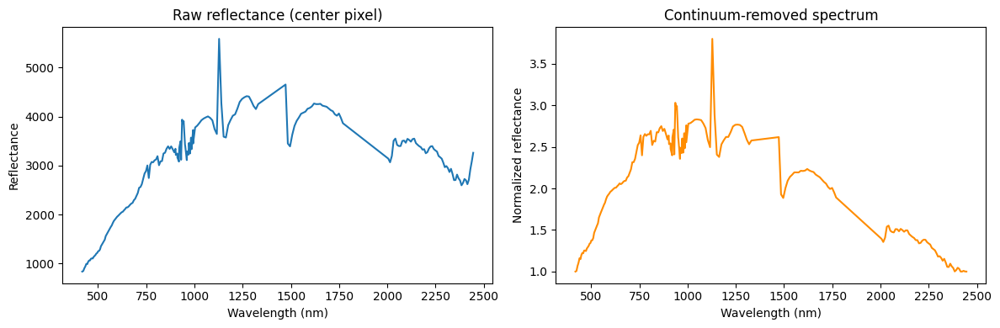

In [21]:
def continuum_remove(spectrum, wl):
    """Convex-hull continuum removal for a single spectrum."""
    valid = ~np.isnan(spectrum)
    x, y = wl[valid], spectrum[valid]
    if len(x) < 3:
        return spectrum
    pts = np.column_stack([x, y])
    # upper convex hull
    hull_idx = [0]
    for i in range(1, len(pts)):
        while len(hull_idx) >= 2:
            x1, y1 = pts[hull_idx[-2]]
            x2, y2 = pts[hull_idx[-1]]
            x3, y3 = pts[i]
            cross = (x2-x1)*(y3-y1) - (y2-y1)*(x3-x1)
            if cross <= 0:
                hull_idx.pop()
            else:
                break
        hull_idx.append(i)
    hx, hy = x[hull_idx], y[hull_idx]
    continuum = interp1d(hx, hy, bounds_error=False, fill_value='extrapolate')(x)
    cr = np.full_like(spectrum, np.nan)
    cr[valid] = y / continuum
    return cr

# Example: continuum removal on a demo pixel. Pick the nearest *valid*
# (non-vegetated, non-nodata) pixel to the scene center, since the center
# pixel itself may have been masked out by the vegetation mask in Section 4.1.
def nearest_valid_pixel(cube, cy0, cx0):
    valid2d = ~np.isnan(cube).any(axis=0)
    if valid2d[cy0, cx0]:
        return cy0, cx0
    yy, xx = np.mgrid[0:cube.shape[1], 0:cube.shape[2]]
    dist = np.where(valid2d, np.hypot(yy - cy0, xx - cx0), np.inf)
    return np.unravel_index(np.argmin(dist), dist.shape)

cy0, cx0 = refl_clean.shape[1]//2, refl_clean.shape[2]//2
cy, cx = nearest_valid_pixel(refl_clean, cy0, cx0)
px_spectrum = refl_clean[:, cy, cx]
cr_spectrum = continuum_remove(px_spectrum, wl_clean)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(wl_clean, px_spectrum); axes[0].set_title('Raw reflectance (center pixel)')
axes[0].set_xlabel('Wavelength (nm)'); axes[0].set_ylabel('Reflectance')
axes[1].plot(wl_clean, cr_spectrum, color='darkorange'); axes[1].set_title('Continuum-removed spectrum')
axes[1].set_xlabel('Wavelength (nm)'); axes[1].set_ylabel('Normalized reflectance')
plt.tight_layout(); plt.show()

## 8. Spectral Angle Mapper (SAM) vs. reference endmembers

SAM measures the angle between each pixel's spectrum and reference mineral spectra — smaller angle = better match. Plug in real reference spectra from the [USGS Spectral Library](https://crustal.usgs.gov/speclab/QueryAll07a.php) (resample to EnMAP's `wl_clean` grid first). Below uses simplified placeholder reference curves — replace `reference_spectra` with real, wavelength-matched library data before drawing geological conclusions.

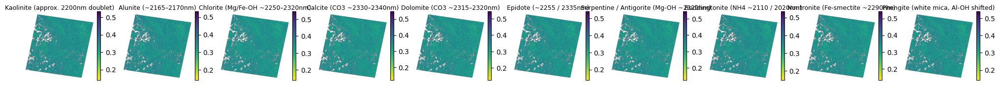

In [23]:
def sam(pixel_spectra, reference):
    """pixel_spectra: (bands, rows, cols); reference: (bands,). Returns angle map (rows, cols) in radians."""
    b, rr, cc = pixel_spectra.shape
    flat = pixel_spectra.reshape(b, -1)
    ref = reference.reshape(-1, 1)
    valid = ~np.isnan(flat).any(axis=0)
    num = np.zeros(flat.shape[1]); den = np.zeros(flat.shape[1])
    num[valid] = (flat[:, valid] * ref).sum(axis=0)
    den[valid] = np.linalg.norm(flat[:, valid], axis=0) * np.linalg.norm(ref)
    with np.errstate(divide='ignore', invalid='ignore'):
        cos_angle = np.clip(num / den, -1, 1)
    angle = np.arccos(cos_angle)
    angle[~valid] = np.nan
    return angle.reshape(rr, cc)

# TODO: replace with real USGS splib reflectance resampled onto wl_clean
def synthetic_reference(center_nm, width_nm, depth=0.5, wl=wl_clean):
    ref = np.ones_like(wl)
    ref -= depth * np.exp(-0.5 * ((wl - center_nm) / width_nm) ** 2)
    return ref

reference_spectra = {
'Kaolinite (approx. 2200nm doublet)': synthetic_reference(2200, 20),
'Alunite (~2165–2170nm)': synthetic_reference(2165, 20),
'Chlorite (Mg/Fe-OH ~2250–2320nm)': synthetic_reference(2255, 30),
'Calcite (CO3 ~2330–2340nm)': synthetic_reference(2335, 25),
'Dolomite (CO3 ~2315–2320nm)': synthetic_reference(2315, 25),
'Epidote (~2255 / 2335nm)': synthetic_reference(2255, 25),
'Serpentine / Antigorite (Mg-OH ~2320nm)': synthetic_reference(2320, 25),
'Buddingtonite (NH4 ~2110 / 2020nm)': synthetic_reference(2110, 25),
'Nontronite (Fe-smectite ~2290nm)': synthetic_reference(2290, 25),
'Phengite (white mica, Al-OH shifted)': synthetic_reference(2215, 25),
}

fig, axes = plt.subplots(1, len(reference_spectra), figsize=(20, 5))
sam_maps = {}
for ax, (name, ref) in zip(axes, reference_spectra.items()):
    angle_map = sam(refl_clean, ref)
    sam_maps[name] = angle_map
    im = ax.imshow(angle_map, cmap='viridis_r')  # low angle (good match) shown bright
    ax.set_title(name, fontsize=9); ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046)
plt.tight_layout(); plt.show()

Here's the code with a contrast stretch applied to the SAM angle maps — since low angle = good match, I've biased the stretch toward the lower end of the angle range so good matches stand out more clearly:

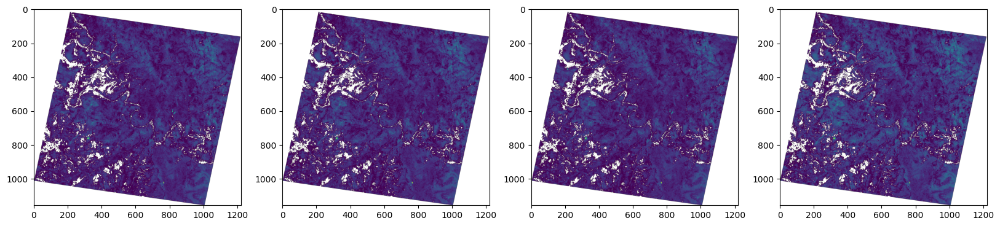

In [24]:
def sam(pixel_spectra, reference):
    """pixel_spectra: (bands, rows, cols); reference: (bands,). Returns angle map (rows, cols) in radians."""
    b, rr, cc = pixel_spectra.shape
    flat = pixel_spectra.reshape(b, -1)
    ref = reference.reshape(-1, 1)
    valid = ~np.isnan(flat).any(axis=0)
    num = np.zeros(flat.shape[1]); den = np.zeros(flat.shape[1])
    num[valid] = (flat[:, valid] * ref).sum(axis=0)
    den[valid] = np.linalg.norm(flat[:, valid], axis=0) * np.linalg.norm(ref)
    with np.errstate(divide='ignore', invalid='ignore'):
        cos_angle = np.clip(num / den, -1, 1)
    angle = np.arccos(cos_angle)
    angle[~valid] = np.nan
    return angle.reshape(rr, cc)

# TODO: replace with real USGS splib reflectance resampled onto wl_clean
def synthetic_reference(center_nm, width_nm, depth=0.5, wl=wl_clean):
    ref = np.ones_like(wl)
    ref -= depth * np.exp(-0.5 * ((wl - center_nm) / width_nm) ** 2)
    return ref

reference_spectra = {
    'Kaolinite (approx. 2200nm doublet)': synthetic_reference(2200, 20),
    'Alunite (approx. 2170nm)': synthetic_reference(2170, 15),
    'Calcite (approx. 2330nm)': synthetic_reference(2335, 20),
    'Hematite (approx. 850+650nm)': synthetic_reference(650, 40, depth=0.3),
}

def sam_contrast_stretch(angle_map, low=0, high=90):
    """
    Percentile clip biased toward the low-angle (best-match) end, since
    that's where the meaningful mineral signal lives. Most background
    pixels sit at large angles and would otherwise dominate the range.
    """
    valid = np.isfinite(angle_map)
    if not valid.any():
        return np.zeros_like(angle_map)
    vmin, vmax = np.nanpercentile(angle_map[valid], [low, high])
    if vmax <= vmin:
        vmax = vmin + 1e-6
    out = np.clip((angle_map - vmin) / (vmax - vmin), 0, 1)
    out[~valid] = np.nan
    return out

fig, axes = plt.subplots(1, len(reference_spectra), figsize=(20, 5))
sam_maps = {}
for ax, (name, ref) in zip(axes, reference_spectra.items()):
    angle_map = sam(refl_clean, ref)
    sam_maps[name] = angle_map

    stretched = sam_contrast_stretch(angle_map, low=0, high=90)
    im = ax.imshow(stretched, cmap='viridis_r', vmin=0, vmax=1)  # low angle (good match) shown bright

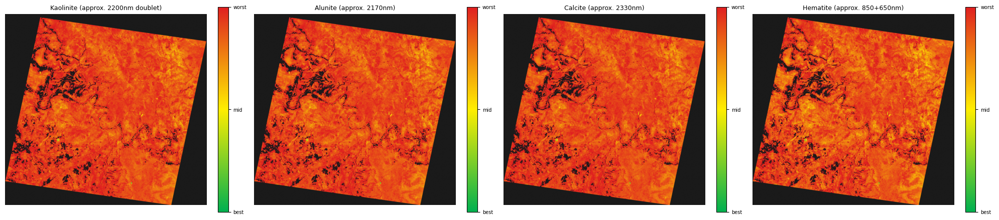

In [25]:
import matplotlib.colors as mcolors

def sam(pixel_spectra, reference):
    """pixel_spectra: (bands, rows, cols); reference: (bands,). Returns angle map (rows, cols) in radians."""
    b, rr, cc = pixel_spectra.shape
    flat = pixel_spectra.reshape(b, -1)
    ref = reference.reshape(-1, 1)
    valid = ~np.isnan(flat).any(axis=0)
    num = np.zeros(flat.shape[1]); den = np.zeros(flat.shape[1])
    num[valid] = (flat[:, valid] * ref).sum(axis=0)
    den[valid] = np.linalg.norm(flat[:, valid], axis=0) * np.linalg.norm(ref)
    with np.errstate(divide='ignore', invalid='ignore'):
        cos_angle = np.clip(num / den, -1, 1)
    angle = np.arccos(cos_angle)
    angle[~valid] = np.nan
    return angle.reshape(rr, cc)

# TODO: replace with real USGS splib reflectance resampled onto wl_clean
def synthetic_reference(center_nm, width_nm, depth=0.5, wl=wl_clean):
    ref = np.ones_like(wl)
    ref -= depth * np.exp(-0.5 * ((wl - center_nm) / width_nm) ** 2)
    return ref

reference_spectra = {
    'Kaolinite (approx. 2200nm doublet)': synthetic_reference(2200, 20),
    'Alunite (approx. 2170nm)': synthetic_reference(2170, 15),
    'Calcite (approx. 2330nm)': synthetic_reference(2335, 20),
    'Hematite (approx. 850+650nm)': synthetic_reference(650, 40, depth=0.3),
}

def sam_contrast_stretch(angle_map, low=0, high=90):
    """
    Percentile clip biased toward the low-angle (best-match) end, since
    that's where the meaningful mineral signal lives. Most background
    pixels sit at large angles and would otherwise dominate the range.
    """
    valid = np.isfinite(angle_map)
    if not valid.any():
        return np.zeros_like(angle_map)
    vmin, vmax = np.nanpercentile(angle_map[valid], [low, high])
    if vmax <= vmin:
        vmax = vmin + 1e-6
    out = np.clip((angle_map - vmin) / (vmax - vmin), 0, 1)
    out[~valid] = np.nan
    return out

# RGB match-quality colormap: green (best match) -> yellow (mid) -> red (worst match)
rgb_match_cmap = mcolors.LinearSegmentedColormap.from_list(
    'rgb_match', ['#00b050', '#ffee00', '#e02020'], N=256
)
rgb_match_cmap.set_bad(color='#1a1a1a')  # NaN pixels shown dark grey, not white

fig, axes = plt.subplots(1, len(reference_spectra), figsize=(20, 5))
sam_maps = {}
for ax, (name, ref) in zip(axes, reference_spectra.items()):
    angle_map = sam(refl_clean, ref)
    sam_maps[name] = angle_map

    stretched = sam_contrast_stretch(angle_map, low=0, high=90)
    im = ax.imshow(stretched, cmap=rgb_match_cmap, vmin=0, vmax=1)  # green = good match, red = poor match
    ax.set_title(name, fontsize=9); ax.axis('off')

    cbar = plt.colorbar(im, ax=ax, fraction=0.046)
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels(['best', 'mid', 'worst'])
    cbar.ax.tick_params(labelsize=7)

plt.tight_layout(); plt.show()

a linear green→yellow→red split makes red dominate visually since it occupies half the range, even though most of your data (poor matches) sits far above the midpoint. Two fixes worth combining:

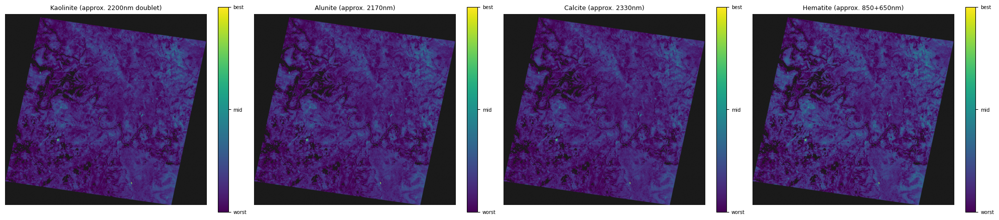

In [27]:
import matplotlib.colors as mcolors

def sam(pixel_spectra, reference):
    """pixel_spectra: (bands, rows, cols); reference: (bands,). Returns angle map (rows, cols) in radians."""
    b, rr, cc = pixel_spectra.shape
    flat = pixel_spectra.reshape(b, -1)
    ref = reference.reshape(-1, 1)
    valid = ~np.isnan(flat).any(axis=0)
    num = np.zeros(flat.shape[1]); den = np.zeros(flat.shape[1])
    num[valid] = (flat[:, valid] * ref).sum(axis=0)
    den[valid] = np.linalg.norm(flat[:, valid], axis=0) * np.linalg.norm(ref)
    with np.errstate(divide='ignore', invalid='ignore'):
        cos_angle = np.clip(num / den, -1, 1)
    angle = np.arccos(cos_angle)
    angle[~valid] = np.nan
    return angle.reshape(rr, cc)

# TODO: replace with real USGS splib reflectance resampled onto wl_clean
def synthetic_reference(center_nm, width_nm, depth=0.5, wl=wl_clean):
    ref = np.ones_like(wl)
    ref -= depth * np.exp(-0.5 * ((wl - center_nm) / width_nm) ** 2)
    return ref

reference_spectra = {
    'Kaolinite (approx. 2200nm doublet)': synthetic_reference(2200, 20),
    'Alunite (approx. 2170nm)': synthetic_reference(2170, 15),
    'Calcite (approx. 2330nm)': synthetic_reference(2335, 20),
    'Hematite (approx. 850+650nm)': synthetic_reference(650, 40, depth=0.3),
}

def sam_contrast_stretch(angle_map, low=0, high=90):
    """Percentile clip biased toward the low-angle (best-match) end."""
    valid = np.isfinite(angle_map)
    if not valid.any():
        return np.zeros_like(angle_map)
    vmin, vmax = np.nanpercentile(angle_map[valid], [low, high])
    if vmax <= vmin:
        vmax = vmin + 1e-6
    out = np.clip((angle_map - vmin) / (vmax - vmin), 0, 1)
    out[~valid] = np.nan
    return out

# --- Colormap choice ---
# Default: viridis (perceptually uniform, colorblind-safe, standard for scientific match/quality data).
# Dark purple = worst match, bright yellow = best match, so it reads intuitively without red/green bias.
match_cmap = plt.get_cmap('viridis').copy()
match_cmap.set_bad(color='#1a1a1a')  # NaN pixels shown dark grey

# Alternative: weighted traffic-light, if you specifically want green/yellow/red.
# Stops pushed to 0.7 and 0.9 (rather than 0.33/0.66) so red only appears for the
# worst ~10-15% of matches instead of dominating half the color range.
# match_cmap = mcolors.LinearSegmentedColormap.from_list(
#     'rgb_match_weighted',
#     [(0.0, '#00b050'), (0.55, '#8fd400'), (0.75, '#ffee00'), (1.0, '#e02020')],
# )
# match_cmap.set_bad(color='#1a1a1a')

fig, axes = plt.subplots(1, len(reference_spectra), figsize=(20, 5))
sam_maps = {}
for ax, (name, ref) in zip(axes, reference_spectra.items()):
    angle_map = sam(refl_clean, ref)
    sam_maps[name] = angle_map

    stretched = sam_contrast_stretch(angle_map, low=0, high=90)
    # Note: stretched is oriented low=best match, high=worst match.
    # viridis reads dark(low)->bright(high), so invert stretched here to keep "best match = brightest".
    im = ax.imshow(1 - stretched, cmap=match_cmap, vmin=0, vmax=1)
    ax.set_title(name, fontsize=9); ax.axis('off')

    cbar = plt.colorbar(im, ax=ax, fraction=0.046)
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels(['worst', 'mid', 'best'])
    cbar.ax.tick_params(labelsize=7)

plt.tight_layout(); plt.show()

## 9. Dimensionality reduction (PCA)

Compresses correlated bands into a handful of components that concentrate mineralogical/geological variance — useful both for visualization and as input to clustering. Swap in an MNF transform (noise-whitened) if you have per-band noise estimates.

Explained variance ratio: [0.8247 0.1178 0.0201 0.0179 0.0059 0.0031]


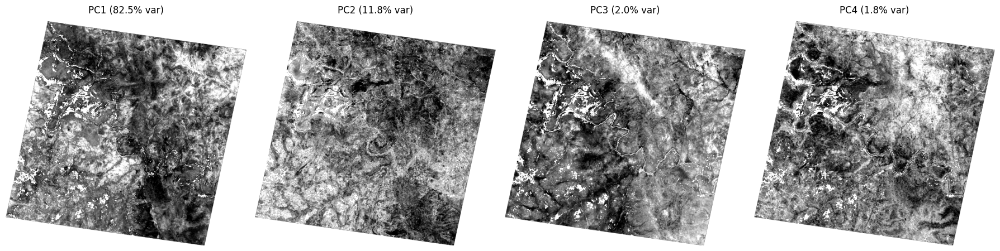

In [28]:
bands, rows, cols = refl_clean.shape
X = refl_clean.reshape(bands, -1).T  # (pixels, bands)
valid_mask = ~np.isnan(X).any(axis=1)
X_valid = X[valid_mask]

n_components = 6
pca = PCA(n_components=n_components)
pcs_valid = pca.fit_transform(X_valid)

pcs_full = np.full((X.shape[0], n_components), np.nan)
pcs_full[valid_mask] = pcs_valid
pc_image = pcs_full.T.reshape(n_components, rows, cols)

print('Explained variance ratio:', np.round(pca.explained_variance_ratio_, 4))

fig, axes = plt.subplots(1, 4, figsize=(18, 5))
for i, ax in enumerate(axes):
    ax.imshow(stretch(pc_image[i]), cmap='gray')
    ax.set_title(f'PC{i+1} ({pca.explained_variance_ratio_[i]*100:.1f}% var)')
    ax.axis('off')
plt.tight_layout(); plt.show()

## 10. Unsupervised mineral zonation (K-Means on PCA components)

Groups pixels into spectrally distinct classes — a quick way to delineate alteration zones for field follow-up. Inspect each cluster's mean spectrum and cross-check against Section 8's SAM maps to assign mineralogical labels.

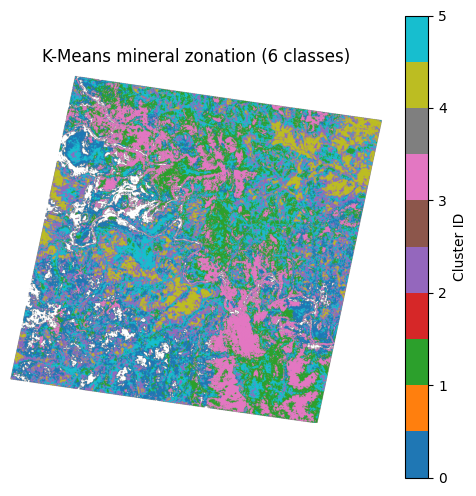

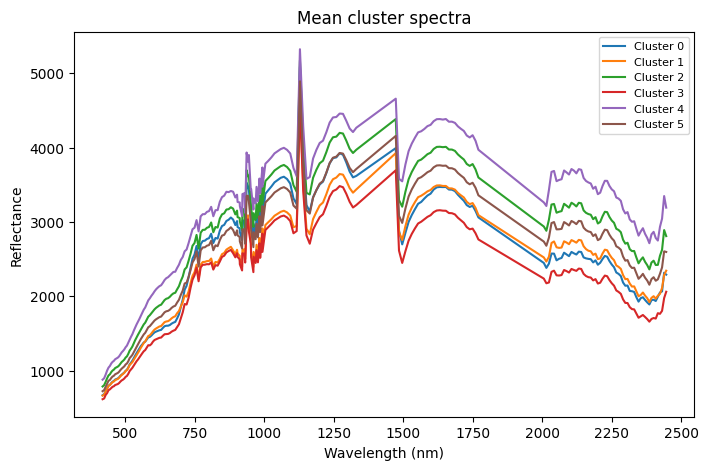

In [29]:
n_clusters = 6
km = KMeans(n_clusters=n_clusters, n_init=10, random_state=0)
labels_valid = km.fit_predict(pcs_valid)

labels_full = np.full(X.shape[0], -1)
labels_full[valid_mask] = labels_valid
cluster_map = labels_full.reshape(rows, cols)

plt.figure(figsize=(6, 6))
plt.imshow(np.ma.masked_equal(cluster_map, -1), cmap='tab10')
plt.title(f'K-Means mineral zonation ({n_clusters} classes)')
plt.axis('off'); plt.colorbar(label='Cluster ID')
plt.show()

# Mean spectrum per cluster — inspect diagnostic absorption features here
plt.figure(figsize=(8, 5))
for c in range(n_clusters):
    mask = cluster_map == c
    if mask.sum() == 0:
        continue
    mean_spec = np.nanmean(refl_clean[:, mask], axis=1)
    plt.plot(wl_clean, mean_spec, label=f'Cluster {c}')
plt.xlabel('Wavelength (nm)'); plt.ylabel('Reflectance')
plt.legend(fontsize=8); plt.title('Mean cluster spectra')
plt.show()

## 11. Export results as GeoTIFF

In [ ]:
OUTPUT_DIR = '/content/enmap_outputs'
os.makedirs(OUTPUT_DIR, exist_ok=True)

def export_single_band(array, out_path, profile):
    out_profile = profile.copy()
    out_profile.update(count=1, dtype='float32', driver='GTiff', interleave='band')
    with rasterio.open(out_path, 'w', **out_profile) as dst:
        dst.write(array.astype(np.float32), 1)

# Export mineral indices
for name, img in indices.items():
    fname = name.split('(')[0].strip().replace(' ', '_').replace('/', '_').lower() + '.tif'
    export_single_band(img, os.path.join(OUTPUT_DIR, fname), profile)

# Export SAM angle maps
for name, img in sam_maps.items():
    fname = 'sam_' + name.split('(')[0].strip().replace(' ', '_').replace('/', '_').lower() + '.tif'
    export_single_band(img, os.path.join(OUTPUT_DIR, fname), profile)

# Export cluster map
export_single_band(cluster_map, os.path.join(OUTPUT_DIR, 'kmeans_clusters.tif'), profile)

print('Exported files:')
for f in sorted(os.listdir(OUTPUT_DIR)):
    print(' -', f)

# Optional: copy results to Google Drive
# import shutil
# shutil.copytree(OUTPUT_DIR, '/content/drive/MyDrive/EnMAP_outputs', dirs_exist_ok=True)

Exported files:
 - al-oh_clay_mica.tif
 - ferrous_iron.tif
 - hydroxyl_generic.tif
 - iron_oxide.tif
 - kmeans_clusters.tif
 - mg-oh_carbonate_chlorite.tif
 - sam_alunite.tif
 - sam_calcite.tif
 - sam_hematite.tif
 - sam_kaolinite.tif


## 12. Add L-band SAR radar imagery (ALOS PALSAR-2 / NISAR)

L-band SAR (~23 cm wavelength) penetrates vegetation canopy far better than optical/SWIR light, which matters here because much of the DRC exploration area sits under dense rainforest that can mask EnMAP's spectral signal at the surface. L-band backscatter is instead sensitive to surface roughness, near-surface moisture, and — most usefully for exploration — the structural fabric of the terrain: faults, shear zones, and fracture lineaments that commonly channeled the hydrothermal fluids responsible for alteration and ore deposition (relevant across the DRC's Copperbelt and orogenic-gold settings alike).

This section loads an L-band scene, speckle-filters it, extracts a structural lineament map, and co-registers everything onto the EnMAP pixel grid so it can be fused with the mineral indices from Section 6.

> Get L-band GeoTIFFs from JAXA's [ALOS-2 PALSAR-2 portal](https://www.eorc.jaxa.jp/ALOS/en/dataset/agri_dc_e.htm) or preprocessed, radiometrically terrain-corrected mosaics from [ASF DAAC](https://asf.alaska.edu/data-sets/sar-data-sets/alos-palsar/). NISAR (launched 2025, L-band) products will work the same way once available for your area. Sigma0/gamma0 GeoTIFFs (not raw complex SLC) are the easiest input for this workflow.

In [ ]:
# EDIT THIS to match your L-band SAR scene (ALOS-2 PALSAR-2, JERS-1, or NISAR L-band GeoTIFF).
# A single-band amplitude/DN or sigma0 GeoTIFF is expected (HH or HV — either works for structural mapping).
SAR_PATH = '/content/drive/MyDrive/Enmap/ALOS2_PALSAR2_DRC_HH.tif'

print('L-band SAR image exists:', os.path.exists(SAR_PATH))

### 12.1 Load, calibrate, and speckle-filter the SAR image

In [ ]:
from scipy.ndimage import median_filter, uniform_filter, sobel, gaussian_filter

def load_sar_image(path):
    """Load a single-band SAR GeoTIFF (first band if the file is multi-pol). Returns (array, profile)."""
    with rasterio.open(path) as src:
        arr = src.read(1).astype(np.float32)
        sar_profile = src.profile
    return arr, sar_profile

def to_decibel(arr):
    """Convert linear amplitude/DN backscatter to dB, guarding against log(0)/negative values."""
    out = arr.copy()
    out[out <= 0] = np.nan
    return 10 * np.log10(out)

def lee_filter(img, size=5):
    """Simple Lee speckle filter (local-statistics adaptive smoothing). Chosen over a plain
    median/boxcar filter because it damps speckle in homogeneous areas while preserving the
    sharp edges that mark faults and lineaments — exactly what Section 12.3 needs."""
    img_mean = uniform_filter(img, size)
    img_sqr_mean = uniform_filter(img**2, size)
    img_variance = img_sqr_mean - img_mean**2
    overall_variance = np.nanvar(img)
    weights = img_variance / (img_variance + overall_variance + 1e-9)
    return img_mean + weights * (img - img_mean)

if os.path.exists(SAR_PATH):
    sar_dn, sar_profile = load_sar_image(SAR_PATH)
    sar_db = to_decibel(sar_dn)
else:
    print('SAR_PATH not found -- generating a synthetic demo scene so the rest of this section still runs.')
    rows_s, cols_s = rows, cols  # match the EnMAP grid so downstream fusion 'just works' in the demo
    rng = np.random.default_rng(1)
    yy, xx = np.mgrid[0:rows_s, 0:cols_s]
    sar_db = -12 + 3*np.sin(xx/40) + 2*np.cos(yy/55) + rng.normal(0, 1.5, (rows_s, cols_s))
    for _ in range(4):  # a few synthetic linear 'fault' features
        x0, y0, ang = rng.uniform(0, cols_s), rng.uniform(0, rows_s), rng.uniform(0, np.pi)
        line = np.abs((xx - x0) * np.sin(ang) - (yy - y0) * np.cos(ang))
        sar_db += 4 * np.exp(-(line**2) / 20)
    sar_profile = profile.copy()

sar_db_filtered = lee_filter(np.nan_to_num(sar_db, nan=np.nanmean(sar_db)), size=5)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(sar_db, cmap='gray'); axes[0].set_title('L-band backscatter (dB, raw)'); axes[0].axis('off')
axes[1].imshow(sar_db_filtered, cmap='gray'); axes[1].set_title('Speckle-filtered (Lee, 5x5)'); axes[1].axis('off')
plt.tight_layout(); plt.show()

### 12.2 Co-register the SAR image to the EnMAP grid

EnMAP and an L-band SAR scene almost never share a pixel grid (different sensors, orbits, and often different native resolutions), so any pixel-wise fusion needs the SAR image reprojected and resampled onto the EnMAP `profile`'s CRS/transform/shape first. Bilinear resampling is used since backscatter is a continuous quantity (unlike a categorical map, where nearest-neighbor would be more appropriate).

In [ ]:
from rasterio.warp import reproject, Resampling

def resample_to_reference(src_array, src_profile, ref_profile):
    """Reproject/resample a single-band array onto the reference (EnMAP) grid --
    required before any pixel-wise fusion of SAR and hyperspectral layers."""
    dst = np.full((ref_profile['height'], ref_profile['width']), np.nan, dtype=np.float32)
    reproject(
        source=src_array,
        destination=dst,
        src_transform=src_profile['transform'],
        src_crs=src_profile['crs'],
        dst_transform=ref_profile['transform'],
        dst_crs=ref_profile['crs'],
        resampling=Resampling.bilinear,
    )
    return dst

if os.path.exists(SAR_PATH):
    sar_on_enmap_grid = resample_to_reference(sar_db_filtered, sar_profile, profile)
else:
    sar_on_enmap_grid = sar_db_filtered  # synthetic SAR was already built on the EnMAP demo grid

print('SAR resampled to EnMAP grid:', sar_on_enmap_grid.shape, '-- EnMAP grid:', (rows, cols))

### 12.3 Structural lineament extraction (faults / fractures)

A Sobel gradient highlights sharp linear breaks in backscatter -- typically fault scarps, shear zones, and fracture sets -- which are then smoothed into a local lineament-density surface so it can be combined with the (differently-scaled) mineral indices in Section 13.

In [ ]:
def lineament_density(img, sigma_smooth=1.0, window=15):
    """Sobel-gradient edge magnitude as a structural-lineament proxy, smoothed into a
    local lineament 'density' surface for fusion with the mineral indices."""
    filled = np.nan_to_num(img, nan=np.nanmean(img))
    gx = sobel(filled, axis=1)
    gy = sobel(filled, axis=0)
    edge_mag = np.hypot(gx, gy)
    density = uniform_filter(edge_mag, size=window)
    return gaussian_filter(density, sigma=sigma_smooth)

lineaments = lineament_density(sar_on_enmap_grid)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(sar_on_enmap_grid, cmap='gray'); axes[0].set_title('SAR backscatter (EnMAP grid)'); axes[0].axis('off')
im = axes[1].imshow(stretch(lineaments), cmap='inferno'); axes[1].set_title('Structural lineament density'); axes[1].axis('off')
plt.colorbar(im, ax=axes[1], fraction=0.046)
plt.tight_layout(); plt.show()

## 13. Fuse L-band SAR structure with EnMAP mineral indices

With the SAR layers on the same grid as the hyperspectral cube, two complementary fused products are built:

- **Visual RGB fusion** -- alteration indices in R/G, SAR structure in B -- so alteration zones that sit on/near lineaments jump out visually.
- **Quantitative prospectivity score** -- a weighted sum of normalized alteration indices and lineament density, giving a single ranked surface for field-visit prioritization.

The weights below are illustrative starting points, not a calibrated deposit model -- tune them to the target mineralization style (e.g., weight lineament density higher for structurally-controlled orogenic gold; weight Mg-OH/carbonate higher for stratabound Cu-Co settings) and validate against known occurrences before drawing conclusions.

In [ ]:
def norm01(img, low=2, high=98):
    """Percentile clip + rescale to [0,1] so layers with very different native units/ranges
    (reflectance ratios vs. dB vs. edge magnitude) can be combined on equal footing."""
    valid = np.isfinite(img)
    if not valid.any():
        return np.zeros_like(img)
    vmin, vmax = np.nanpercentile(img[valid], [low, high])
    if vmax <= vmin:
        vmax = vmin + 1e-6
    out = np.clip((img - vmin) / (vmax - vmin), 0, 1)
    out[~valid] = 0
    return out

fused_rgb = np.dstack([
    norm01(indices['Iron Oxide (650/450)']),         # R -- iron oxide alteration
    norm01(indices['Al-OH Clay/Mica (2160/2190)']),  # G -- clay/mica alteration
    norm01(sar_on_enmap_grid),                        # B -- SAR structural/lithologic backscatter
])

plt.figure(figsize=(7, 7))
plt.imshow(fused_rgb)
plt.title('Fused view: R = Iron oxide   G = Al-OH clay/mica   B = L-band SAR backscatter')
plt.axis('off')
plt.show()

In [ ]:
# Weighted, multi-criteria prospectivity score combining hyperspectral alteration
# with SAR structural control. Edit these weights for your target deposit model.
weights = {
    'iron_oxide': 0.25,
    'al_oh': 0.25,
    'mg_oh': 0.15,
    'hydroxyl': 0.15,
    'lineament': 0.20,
}

layers_norm = {
    'iron_oxide': norm01(indices['Iron Oxide (650/450)']),
    'al_oh': norm01(indices['Al-OH Clay/Mica (2160/2190)']),
    'mg_oh': norm01(indices['Mg-OH Carbonate/Chlorite (2330/2120)']),
    'hydroxyl': norm01(indices['Hydroxyl generic (2200/2100)']),
    'lineament': norm01(lineaments),
}

prospectivity = sum(weights[k] * layers_norm[k] for k in weights)

plt.figure(figsize=(7, 7))
im = plt.imshow(prospectivity, cmap='inferno')
plt.title('Combined mineral prospectivity\n(hyperspectral alteration + SAR structural control)')
plt.axis('off'); plt.colorbar(im, label='Prospectivity score (0-1)')
plt.show()

print('Weights used (edit to reflect your target deposit model):')
for k, w in weights.items():
    print(f'  {k}: {w}')

### 13.1 Export the SAR and fused products as GeoTIFF

In [ ]:
# Export SAR-derived and fused layers alongside the hyperspectral products from Section 11.
export_single_band(sar_on_enmap_grid, os.path.join(OUTPUT_DIR, 'sar_lband_backscatter_db.tif'), profile)
export_single_band(lineaments, os.path.join(OUTPUT_DIR, 'sar_lineament_density.tif'), profile)
export_single_band(prospectivity, os.path.join(OUTPUT_DIR, 'combined_prospectivity.tif'), profile)

print('Additional exported files:')
for f in ['sar_lband_backscatter_db.tif', 'sar_lineament_density.tif', 'combined_prospectivity.tif']:
    print(' -', f)

## Next steps

- Swap the synthetic `reference_spectra` in Section 8 for real, wavelength-resampled spectra from the USGS Spectral Library or your own field/lab measurements.
- Validate mineral maps against known geology, drill logs, or ASTER/Sentinel-2 derived alteration maps.
- For large scenes, tile processing (`windows` in `rasterio`) to manage memory in Colab's default runtime, or switch to a High-RAM/GPU runtime.
- Consider Minimum Noise Fraction (MNF) instead of PCA if you have per-band noise statistics — it typically separates signal from noise better for subtle absorption features.
- Cross-reference clusters/SAM matches with the continuum-removed absorption depth/position (Section 7) at diagnostic wavelengths (2160, 2200, 2330 nm) to firm up mineral identifications before field verification.- Swap in a real L-band scene (ALOS-2 PALSAR-2 / NISAR) for the synthetic demo in Section 12 -- radiometrically terrain-corrected sigma0/gamma0 GeoTIFFs give the most reliable backscatter values.
- If you have dual-pol (HH+HV) SAR, compute a cross-pol ratio/difference as an extra layer -- it often improves discrimination between vegetated, bare-rock, and altered-ground surfaces.
- For more rigorous texture analysis than the Sobel-based lineament proxy, compute GLCM texture measures (contrast, homogeneity) with `skimage.feature.graycomatrix` on the filtered SAR image.
- Treat the Section 13 prospectivity weights as a first pass -- recalibrate them against known mineral occurrences, drill results, or a proper weights-of-evidence / logistic model if available.
- Verify `UNUSABLE_CLASS_VALUES` in Section 4.1 against your specific EnMAP L2A product's metadata/README -- DLR's quality-layer class codes have varied across processing baselines, so don't assume the defaults are correct without checking.
- If you only have the spectral fallback (no official quality layer), treat any results over masked/near-masked areas with extra skepticism -- it won't reliably catch thin cirrus or cloud shadow, only obvious thick cloud.
